<a href="https://colab.research.google.com/github/thiagoras/ElasticsearchBundle/blob/master/PyGEO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install geobr

In [2]:
import geobr


In [8]:
censo_RJ_2010 = geobr.read_census_tract(code_tract='RJ', year=2010)

<Axes: >

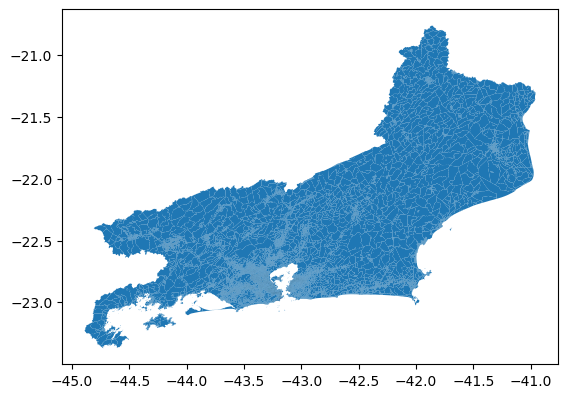

In [9]:
censo_RJ_2010.plot()

In [10]:
censo_RJ_2010.to_file('censo_RJ.gpkg')

In [11]:
censo_RJ_2010.head(5)

,code_tract,zone,code_muni,name_muni,name_neighborhood,code_neighborhood,code_subdistrict,name_subdistrict,code_district,name_district,code_state,geometry
0,330025805000046,URBANO,3300258.0,Arraial Do Cabo,None,NaN,3.300258e+10,None,330025805.0,Arraial Do Cabo,33.0,"POLYGON ((-42.01954 -22.96936, -42.02176 -22.9..."
1,330025805000047,URBANO,3300258.0,Arraial Do Cabo,None,NaN,3.300258e+10,None,330025805.0,Arraial Do Cabo,33.0,"POLYGON ((-42.02282 -22.96769, -42.02455 -22.9..."
2,330025805000048,URBANO,3300258.0,Arraial Do Cabo,None,NaN,3.300258e+10,None,330025805.0,Arraial Do Cabo,33.0,"POLYGON ((-42.16022 -22.9474, -42.16412 -22.94..."
3,330025805000049,URBANO,3300258.0,Arraial Do Cabo,None,NaN,3.300258e+10,None,330025805.0,Arraial Do Cabo,33.0,"POLYGON ((-42.17397 -22.94625, -42.17588 -22.9..."
4,330025805000050,URBANO,3300258.0,Arraial Do Cabo,None,NaN,3.300258e+10,None,330025805.0,Arraial Do Cabo,33.0,"POLYGON ((-42.17588 -22.94609, -42.17848 -22.9..."


In [12]:
from google.colab import drive

In [13]:
drive.mount('/content/drive')

Mounted at /content/drive


In [14]:
from google.colab import files

uploaded = files.upload()

Saving Basico_RJ.csv to Basico_RJ.csv


In [15]:
import pandas as pd


In [19]:
censo=pd.read_csv("Basico_RJ.csv", sep=";", decimal=",", encoding="LATIN-1")

In [22]:
censo.head()

,Cod_setor,V005
0,330010005000001,2356.80
1,330010005000002,2040.47
2,330010005000003,2687.80
3,330010005000004,3026.67
4,330010005000005,1124.82


In [21]:
censo=censo[["Cod_setor", "V005"]]

In [24]:
!pip install contextily

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 43.8 MB/s eta 0:00:00


In [25]:
censo_RJ_2010.crs

<Geographic 2D CRS: EPSG:4674>
Name: SIRGAS 2000
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: Latin America - Central America and South America - onshore and offshore. Brazil - onshore and offshore.
- bounds: (-122.19, -59.87, -25.28, 32.72)
Datum: Sistema de Referencia Geocentrico para las AmericaS 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

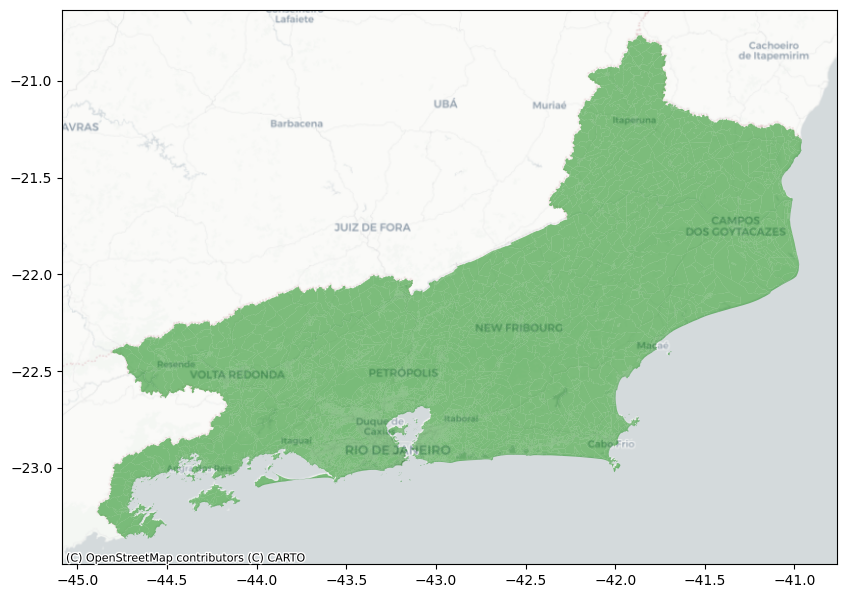

In [26]:
import contextily as ctx

eixo = censo_RJ_2010.plot(color="green", alpha=0.5, figsize=(10,10))
ctx.add_basemap(ax=eixo, crs=censo_RJ_2010.crs,source=ctx.providers.CartoDB.Positron)

In [27]:
censo_RJ_2010.code_tract.dtype


dtype('O')

In [29]:
censo.Cod_setor.dtype

dtype('int64')

In [32]:
censo_RJ_2010.code_tract = censo_RJ_2010.code_tract.astype(int)

In [33]:
dados = censo_RJ_2010.merge(censo, left_on="code_tract", right_on="Cod_setor")

In [34]:
dados.head(3)

,code_tract,zone,code_muni,name_muni,name_neighborhood,code_neighborhood,code_subdistrict,name_subdistrict,code_district,name_district,code_state,geometry,Cod_setor,V005
0,330025805000046,URBANO,3300258.0,Arraial Do Cabo,None,NaN,3.300258e+10,None,330025805.0,Arraial Do Cabo,33.0,"POLYGON ((-42.01954 -22.96936, -42.02176 -22.9...",330025805000046,1499.95
1,330025805000047,URBANO,3300258.0,Arraial Do Cabo,None,NaN,3.300258e+10,None,330025805.0,Arraial Do Cabo,33.0,"POLYGON ((-42.02282 -22.96769, -42.02455 -22.9...",330025805000047,995.26
2,330025805000048,URBANO,3300258.0,Arraial Do Cabo,None,NaN,3.300258e+10,None,330025805.0,Arraial Do Cabo,33.0,"POLYGON ((-42.16022 -22.9474, -42.16412 -22.94...",330025805000048,669.77


In [35]:
!pip install mapclassify -q


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 kB 2.5 MB/s eta 0:00:00


In [36]:
import matplotlib.pyplot as plt


In [37]:
pd.unique(dados.name_muni)

array(['Arraial Do Cabo', 'Angra Dos Reis', 'Barra Do Piraí', 'Aperibé',
       'Araruama', 'Areal', 'Armação Dos Búzios', 'Barra Mansa',
       'Belford Roxo', 'Cabo Frio', 'Campos Dos Goytacazes',
       'Duque De Caxias', 'Bom Jardim', 'Bom Jesus Do Itabapoana',
       'Cachoeiras De Macacu', 'Cambuci', 'Carapebus', 'Itaboraí',
       'Comendador Levy Gasparian', 'Cantagalo', 'Cardoso Moreira',
       'Carmo', 'Casimiro De Abreu', 'Conceição De Macabu', 'Cordeiro',
       'Duas Barras', 'Engenheiro Paulo De Frontin', 'Guapimirim',
       'Iguaba Grande', 'Itaperuna', 'Japeri', 'Magé', 'Itaguaí',
       'Italva', 'Itaocara', 'Mangaratiba', 'Mesquita', 'Niterói',
       'Itatiaia', 'Laje Do Muriaé', 'Macaé', 'Macuco', 'Maricá',
       'Nova Iguaçu', 'Mendes', 'Miguel Pereira', 'Miracema',
       'Natividade', 'Nilópolis', 'Nova Friburgo', 'Petrópolis',
       'Queimados', 'Rio De Janeiro', 'Paracambi', 'Paraíba Do Sul',
       'Paraty', 'Paty Do Alferes', 'Pinheiral', 'Piraí', 'Porciú

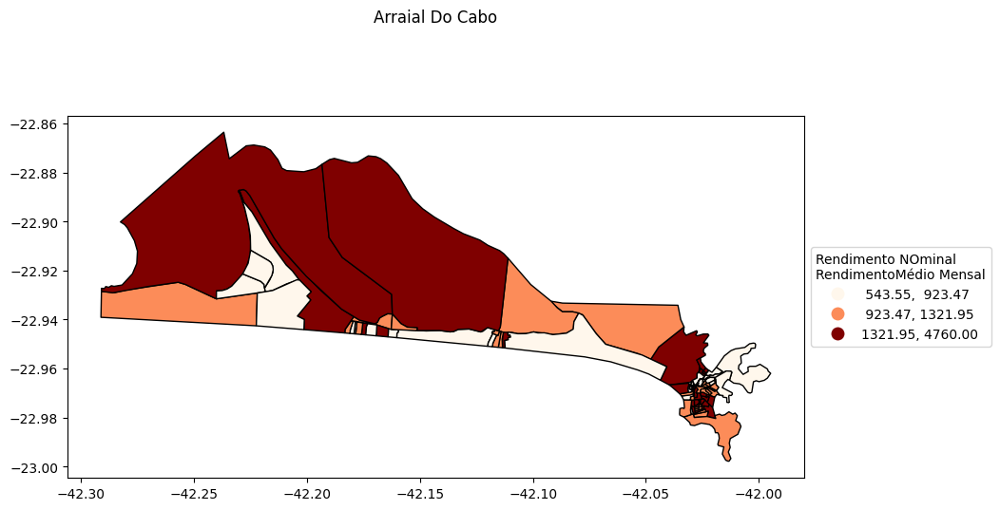

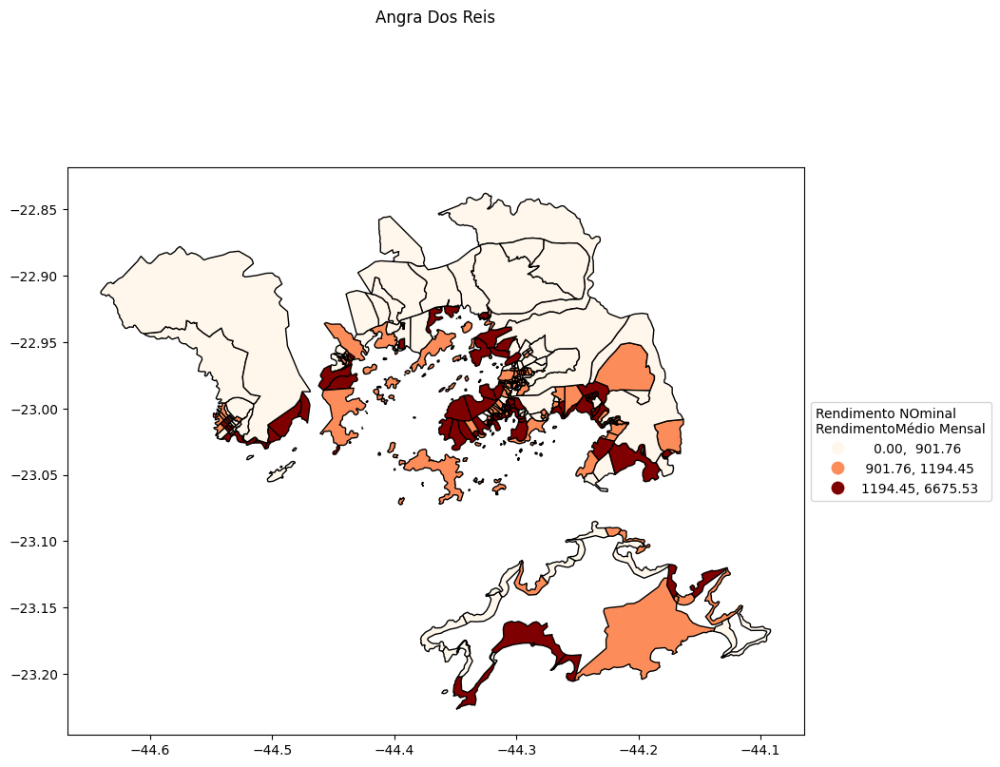

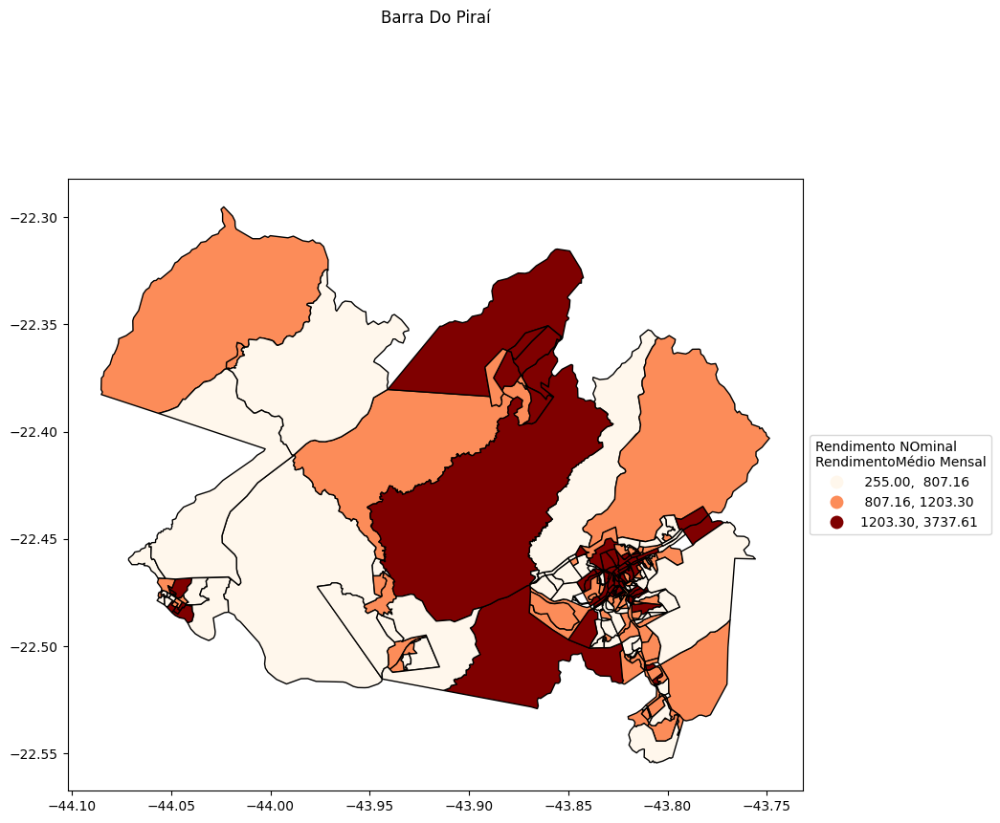

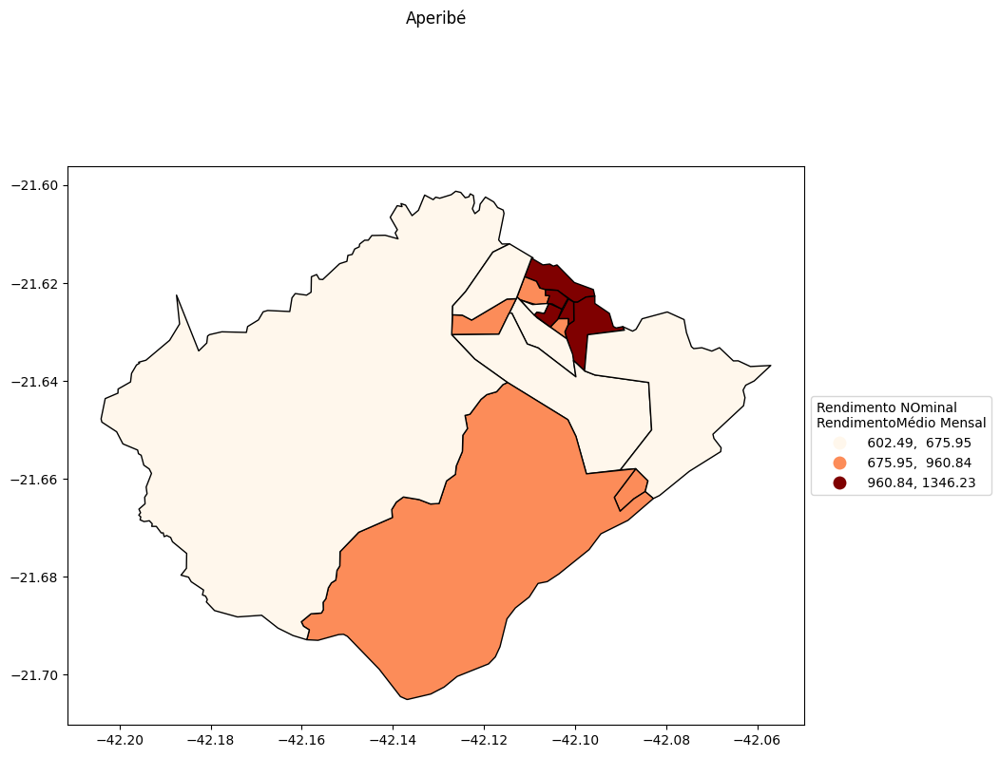

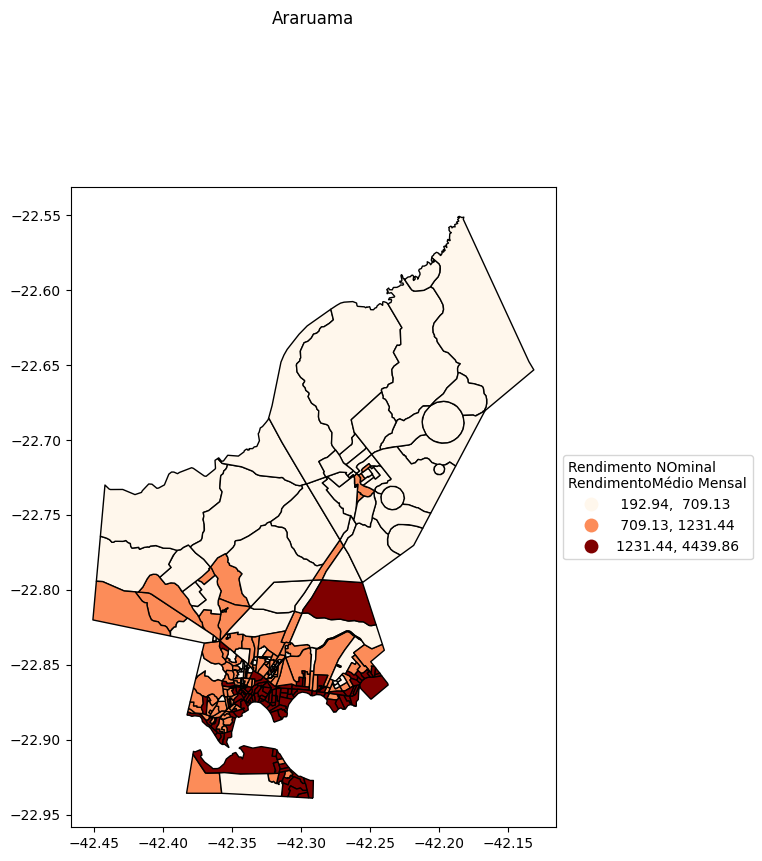

...

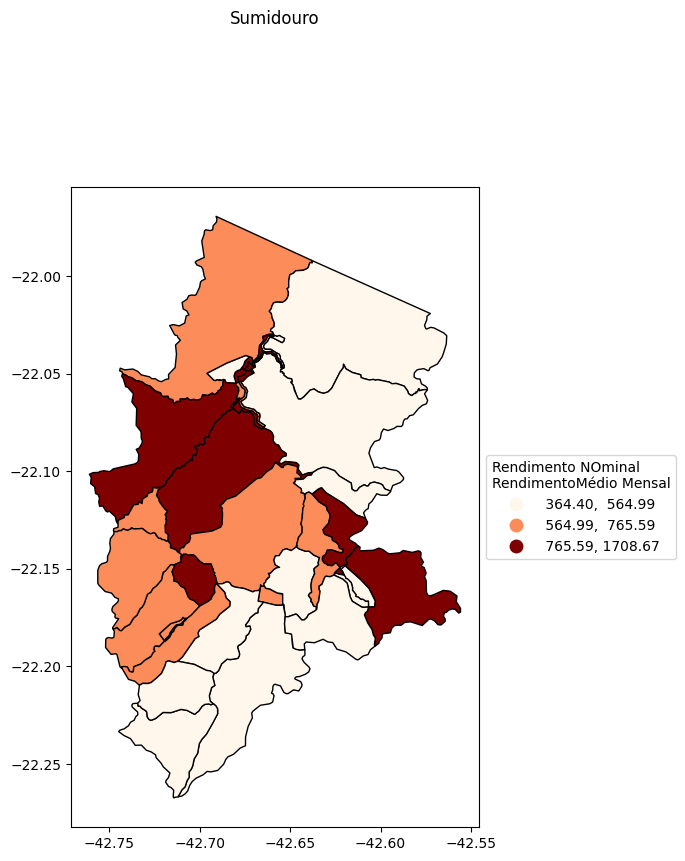

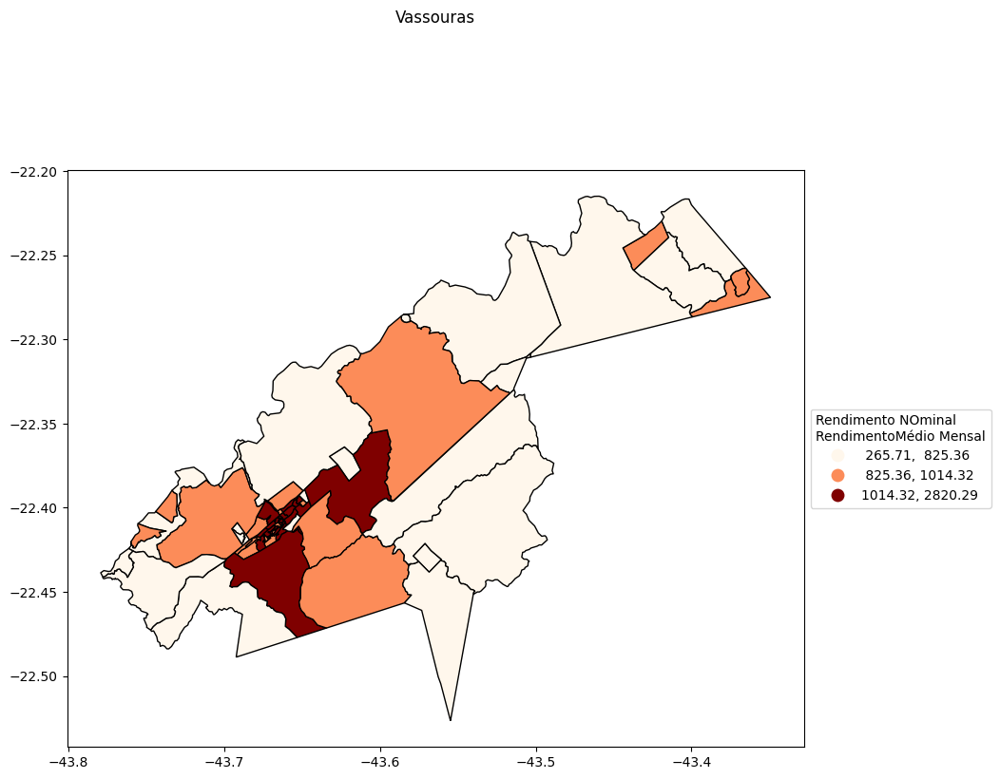

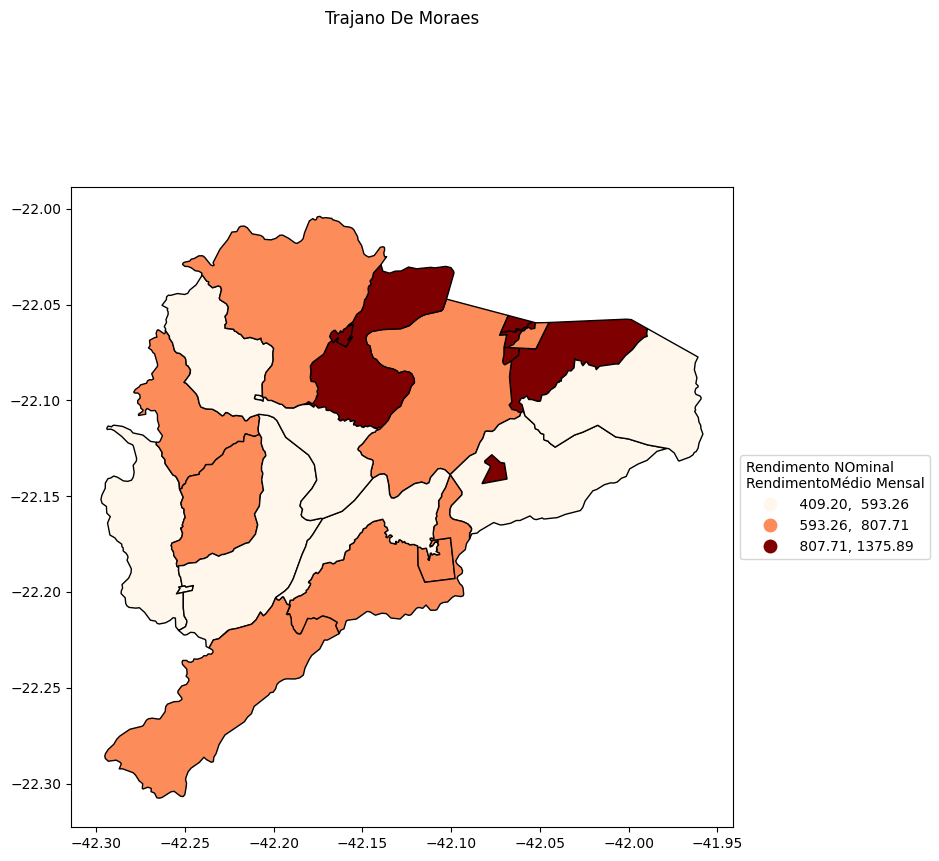

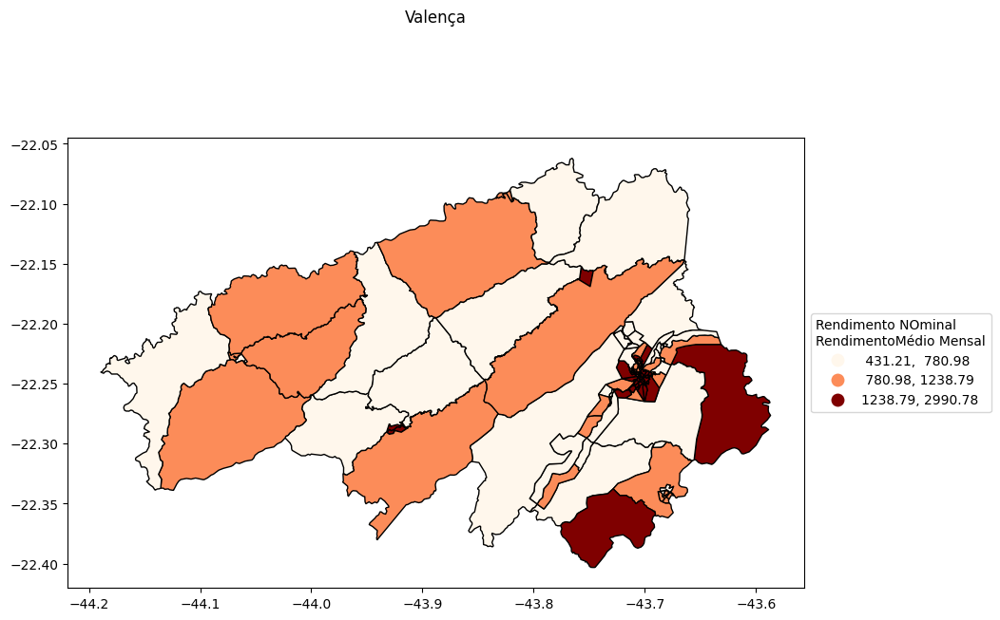

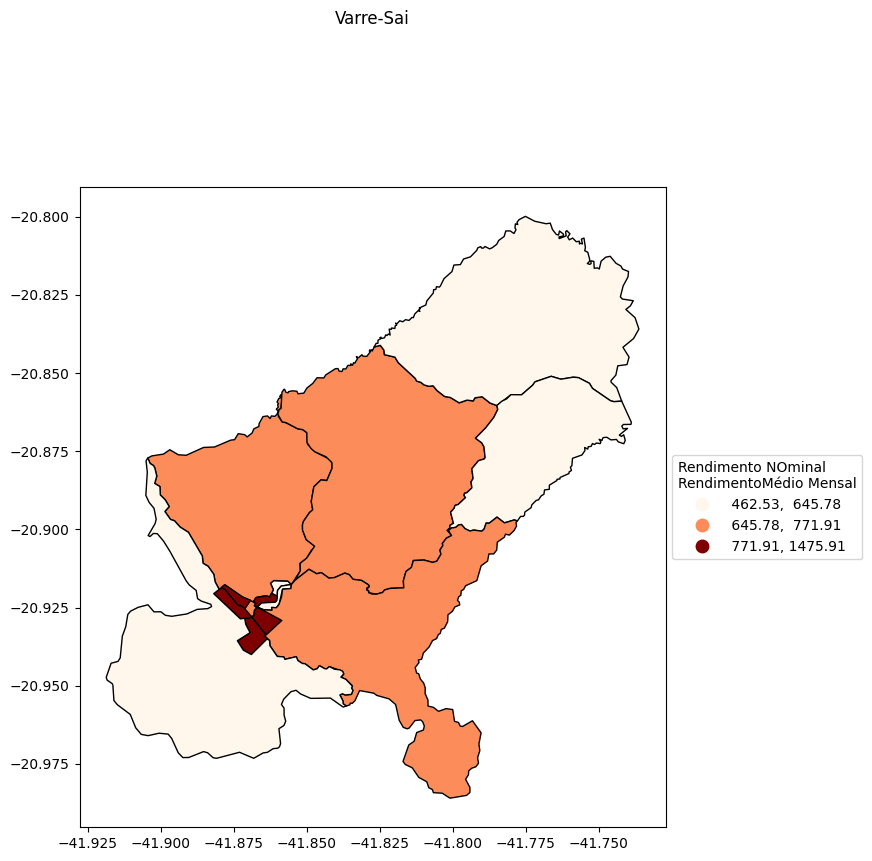

In [39]:
for i in pd.unique(dados.name_muni):
  fig,ax=plt.subplots(figsize=(10,10))
  selec=dados[dados.name_muni==i]
  selec.plot(column="V005", ax=ax, scheme="quantiles", k=3, cmap="OrRd",
             edgecolor="k", legend=True,
             legend_kwds={"loc": "center left", "bbox_to_anchor": (1,0.5),
                          "title": "Rendimento NOminal\nRendimentoMédio Mensal"})
  ax.set_title(i, x=0.5, y=1.25, va="center")
  fig.subplots_adjust(top=0.75)
  fig.tight_layout
  plt.show(block=False)